In [1]:
%load_ext autoreload
%autoreload 2

In [20]:
import os
from glob import glob
import numpy as np
import xarray as xr

import dask
from dask_jobqueue import SLURMCluster
from dask.distributed import Client

import matplotlib.pyplot as plt

import project

In [3]:
variables = [
    "TEMP",
    "SALT",
    "UVEL",
    "VVEL",
    "WVEL",
    "PO4",
    "NO3",
    "SiO3",
    "NH4",
    "Fe",
    "Lig",
    "O2",
    "DIC",
    "DIC_ALT_CO2",
    "ALK",
    "ALK_ALT_CO2",
    "DOC",
    "DON",
    "DOP",
    "DOPr",
    "DONr",
    "DOCr",
    "zooC",
    "spChl",
    "spC",
    "spP",
    "spFe",
    "spCaCO3",
    "diatChl",
    "diatC",
    "diatP",
    "diatFe",
    "diatSi",
    "diazChl",
    "diazC",
    "diazP",
    "diazFe",
]

chunk_spec = {'nlat': -1, 'nlon': -1, 'z_t': 60}

In [4]:
USER = os.environ["USER"]
SCRATCH = f"/pscratch/sd/{USER[0]}/{USER}"
memory = "16GB"
walltime = "120" # minutes
account = "m4746"

# SLURMCluster doesn't seem to generate at usable jobscript
# hack it
job_directives_skip = ["-J", "-e", "-o", "-p","-A", "-n", "--cpus-per-task", "--mem", "-t"]   
job_extra_directives = [
    "-J dask-worker",
    f"-A {account}",
    f"-e {SCRATCH}/dask-workers/dask-worker-%J.err",
    f"-o {SCRATCH}/dask-workers/dask-worker-%J.out",
    f"--time={walltime}",
    f"--mem={memory}",    
    "--qos=shared",    
    "--nodes=1",
    "--ntasks=1",
    "--ntasks-per-node=64", # shared queue only allows half node — don't know if this is really needed
    "--cpus-per-task=1",
    "--constraint=cpu",
]

cluster = SLURMCluster(
    cores=1,
    processes=1,    
    memory=memory,
    queue="debug",
    account=account,
    walltime=walltime,
    job_directives_skip=job_directives_skip,
    job_extra_directives=job_extra_directives,
)

cluster.scale(12)
client = Client(cluster)

client

Connection method: Cluster object,Cluster type: dask_jobqueue.SLURMCluster
Dashboard: http://128.55.64.38:8787/status,
Dashboard: http://128.55.64.38:8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.55.64.38:42615,Workers: 0
Dashboard: http://128.55.64.38:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


Task exception was never retrieved
future: <Task finished name='Task-166843' coro=<Client._gather.<locals>.wait() done, defined at /global/homes/m/mattlong/.conda/envs/cworthy/lib/python3.12/site-packages/distributed/client.py:2396> exception=AllExit()>
Traceback (most recent call last):
  File "/global/homes/m/mattlong/.conda/envs/cworthy/lib/python3.12/site-packages/distributed/client.py", line 2405, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-166849' coro=<Client._gather.<locals>.wait() done, defined at /global/homes/m/mattlong/.conda/envs/cworthy/lib/python3.12/site-packages/distributed/client.py:2396> exception=AllExit()>
Traceback (most recent call last):
  File "/global/homes/m/mattlong/.conda/envs/cworthy/lib/python3.12/site-packages/distributed/client.py", line 2405, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-166998' c

In [5]:
%%time
start_date = "0347-01-01"
end_date = "0361-12-31"

time_case = xr.cftime_range(start_date, end_date, freq='ME', calendar='noleap')

case = "smyle.control.perlmutter.003"

path = f"/pscratch/sd/m/mattlong/archive/{case}/ocn/hist"
files = sorted(glob(f"{path}/{case}.pop.h.[0-9][0-9][0-9][0-9]-[0-9][0-9].nc"))
assert len(files) == len(time_case)

ds = xr.open_mfdataset(
    files, 
    decode_times=False,
    combine='by_coords',
    coords='minimal',
    data_vars='minimal',
    compat='override',
    drop_variables=['transport_regions', 'transport_components', 'moc_components'],  # xarray can't merge these for some reason
    chunks=chunk_spec,
)
ds

CPU times: user 47.7 s, sys: 2.76 s, total: 50.5 s
Wall time: 50.7 s


<xarray.Dataset> Size: 686GB
Dimensions:                          (time: 180, d2: 2, z_t: 60, z_w: 60,
                                      nlat: 384, nlon: 320, z_t_150m: 15,
                                      z_w_bot: 60, z_w_top: 60,
                                      transport_reg: 2, moc_comp: 3, moc_z: 61,
                                      lat_aux_grid: 395, transport_comp: 5)
Coordinates:
  * time                             (time) float64 1kB 1.267e+05 ... 1.321e+05
  * z_t                              (z_t) float32 240B 500.0 ... 5.375e+05
  * z_t_150m                         (z_t_150m) float32 60B 500.0 ... 1.45e+04
  * z_w                              (z_w) float32 240B 0.0 1e+03 ... 5.25e+05
  * z_w_top                          (z_w_top) float32 240B 0.0 ... 5.25e+05
  * z_w_bot                          (z_w_bot) float32 240B 1e+03 ... 5.5e+05
  * lat_aux_grid                     (lat_aux_grid) float32 2kB -79.49 ... 90.0
  * moc_z                            (moc_z) float32 244B 0.0 1e+03 ... 5.5e+05
    ULONG                            (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                             (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                            (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                             (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
Dimensions without coordinates: d2, nlat, nlon, transport_reg, moc_comp,
                                transport_comp
Data variables: (12/485)
    time_bound                       (time, d2) float64 3kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    dz                               (z_t) float32 240B dask.array<chunksize=(60,), meta=np.ndarray>
    dzw                              (z_w) float32 240B dask.array<chunksize=(60,), meta=np.ndarray>
    KMT                              (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    KMU                              (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    REGION_MASK                      (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    ...                               ...
    XBLT                             (time, nlat, nlon) float32 88MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TBLT                             (time, nlat, nlon) float32 88MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    BSF                              (time, nlat, nlon) float32 88MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    MOC                              (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 104MB dask.array<chunksize=(1, 2, 3, 61, 395), meta=np.ndarray>
    N_HEAT                           (time, transport_reg, transport_comp, lat_aux_grid) float32 3MB dask.array<chunksize=(1, 2, 5, 395), meta=np.ndarray>
    N_SALT                           (time, transport_reg, transport_comp, lat_aux_grid) float32 3MB dask.array<chunksize=(1, 2, 5, 395), meta=np.ndarray>
Attributes:
    title:             smyle.control.perlmutter.003
    history:           none
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id$
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2024-08-30 at 23:48:28.5
    cell_methods:      cell_methods = time: mean ==> the variable values are ...

In [6]:
time_ctrl = xr.cftime_range("0306-01-01", "0368-12-31", freq='ME', calendar='noleap')
time_ctrl

CFTimeIndex([0306-01-31 00:00:00, 0306-02-28 00:00:00, 0306-03-31 00:00:00,
             0306-04-30 00:00:00, 0306-05-31 00:00:00, 0306-06-30 00:00:00,
             0306-07-31 00:00:00, 0306-08-31 00:00:00, 0306-09-30 00:00:00,
             0306-10-31 00:00:00,
             ...
             0368-03-31 00:00:00, 0368-04-30 00:00:00, 0368-05-31 00:00:00,
             0368-06-30 00:00:00, 0368-07-31 00:00:00, 0368-08-31 00:00:00,
             0368-09-30 00:00:00, 0368-10-31 00:00:00, 0368-11-30 00:00:00,
             0368-12-31 00:00:00],
            dtype='object', length=756, calendar='noleap', freq='ME')

In [7]:
ndx0 = np.where(time_case[0] == time_ctrl)[0].item()
tndx = np.arange(ndx0, ndx0 + len(time_case), 1)   
tndx

array([492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504,
       505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517,
       518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530,
       531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543,
       544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556,
       557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569,
       570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582,
       583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595,
       596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608,
       609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621,
       622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634,
       635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647,
       648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660,
       661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671])

In [8]:
%%time
smyle_case = "g.e22.GOMIPECOIAF_JRA-1p4-2018.TL319_g17.SMYLE.005"
stream = "pop.h"
datestr = "030601-036812"
fpath_smyle = "/global/cfs/projectdirs/m4746/Datasets/SMYLE-FOSI/ocn/proc/tseries/month_1"

ds_out = xr.Dataset()

for v in variables:
    print(f"working on {v}...")
    file_in = f"{fpath_smyle}/{smyle_case}.{stream}.{v}.{datestr}.nc"
    assert os.path.exists(file_in)
    ds_ctrl = xr.open_dataset(file_in, decode_times=False, chunks=chunk_spec).isel(time=tndx)

    if "z_t" in ds_ctrl[v].dims:
        isel_timeseries = dict(z_t=0, nlat=0, nlon=0)
        isel_slab = dict(z_t=0, time=-1) 
        z_dim = "z_t"        

    elif "z_w_top" in ds_ctrl[v].dims:
        isel_timeseries = dict(z_w_top=9, nlat=0, nlon=0)
        isel_slab = dict(z_w_top=9, time=-1) 
        z_dim = "z_w_top"
        
    elif "z_t_150m" in ds_ctrl[v].dims:
        isel_timeseries = dict(z_t_150m=0, nlat=0, nlon=0)
        isel_slab = dict(z_t_150m=0, time=-1)        
        z_dim = "z_t_150m"        
        
    n = ds[v].isel(time=0).notnull().sum()
    ds_out[f"{v}_rmse"] = xr.full_like(ds[v].isel(**isel_timeseries), fill_value=np.nan)
    ds_out[f"{v}_diff"] = xr.full_like(ds[v].isel(**isel_slab), fill_value=np.nan)    
        
    ds_out[f"{v}_rmse"].data = np.sqrt(((ds[v] - ds_ctrl[v]) ** 2 / n ).sum([z_dim, 'nlat', 'nlon',]))
    ds_out[f"{v}_diff"].data = (ds[v] - ds_ctrl[v]).isel(**isel_slab)        
    
ds_out

working on TEMP...
working on SALT...
working on UVEL...
working on VVEL...
working on WVEL...
working on PO4...
working on NO3...
working on SiO3...
working on NH4...
working on Fe...
working on Lig...
working on O2...
working on DIC...
working on DIC_ALT_CO2...
working on ALK...
working on ALK_ALT_CO2...
working on DOC...
working on DON...
working on DOP...
working on DOPr...
working on DONr...
working on DOCr...
working on zooC...
working on spChl...
working on spC...
working on spP...
working on spFe...
working on spCaCO3...
working on diatChl...
working on diatC...
working on diatP...
working on diatFe...
working on diatSi...
working on diazChl...
working on diazC...
working on diazP...
working on diazFe...
CPU times: user 11.4 s, sys: 1.95 s, total: 13.4 s
Wall time: 2min 53s


<xarray.Dataset> Size: 18MB
Dimensions:           (time: 180, nlat: 384, nlon: 320)
Coordinates:
  * time              (time) float64 1kB 1.267e+05 1.267e+05 ... 1.321e+05
    z_t               float32 4B 500.0
    ULONG             float64 8B dask.array<chunksize=(), meta=np.ndarray>
    ULAT              float64 8B dask.array<chunksize=(), meta=np.ndarray>
    TLONG             float64 8B dask.array<chunksize=(), meta=np.ndarray>
    TLAT              float64 8B dask.array<chunksize=(), meta=np.ndarray>
    z_w_top           float32 4B 9e+03
    z_t_150m          float32 4B 500.0
Dimensions without coordinates: nlat, nlon
Data variables: (12/74)
    TEMP_rmse         (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    TEMP_diff         (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    SALT_rmse         (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    SALT_diff         (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    UVEL_rmse         (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    UVEL_diff         (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    ...                ...
    diazC_rmse        (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    diazC_diff        (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    diazP_rmse        (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    diazP_diff        (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    diazFe_rmse       (time) float64 1kB dask.array<chunksize=(1,), meta=np.ndarray>
    diazFe_diff       (nlat, nlon) float32 492kB dask.array<chunksize=(384, 320), meta=np.ndarray>

In [9]:
%%time
dir_out = f"{project.dir_data}/Case-Validation"
os.makedirs(dir_out, exist_ok=True)

ds_out.to_zarr(
    f"{dir_out}/{case}.diff.zarr", 
    mode="w",
    consolidated=True,
)

In [17]:
ds_o = xr.open_zarr(f"{dir_out}/{case}.diff.zarr").compute()
ds_o

<xarray.Dataset> Size: 18MB
Dimensions:           (nlat: 384, nlon: 320, time: 180)
Coordinates:
    TLAT              float64 8B -79.22
    TLONG             float64 8B 320.6
    ULAT              float64 8B -78.95
    ULONG             float64 8B 321.1
  * time              (time) object 1kB 0347-02-01 00:00:00 ... 0362-01-01 00...
    z_t               float32 4B 500.0
    z_t_150m          float32 4B 500.0
    z_w_top           float32 4B 9e+03
Dimensions without coordinates: nlat, nlon
Data variables: (12/74)
    ALK_ALT_CO2_diff  (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    ALK_ALT_CO2_rmse  (time) float64 1kB 0.06591 0.1465 0.1492 ... 0.3776 0.3642
    ALK_diff          (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    ALK_rmse          (time) float64 1kB 0.06591 0.1465 0.1492 ... 0.3776 0.3642
    DIC_ALT_CO2_diff  (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    DIC_ALT_CO2_rmse  (time) float64 1kB 0.182 0.3622 0.4122 ... 0.7019 0.7069
    ...                ...
    spFe_diff         (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    spFe_rmse         (time) float64 1kB 5.27e-08 1.149e-07 ... 2.091e-07
    spP_diff          (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    spP_rmse          (time) float64 1kB 1.52e-05 3.709e-05 ... 0.0002345
    zooC_diff         (nlat, nlon) float32 492kB nan nan nan nan ... nan nan nan
    zooC_rmse         (time) float64 1kB 0.001508 0.004813 ... 0.00531 0.01416

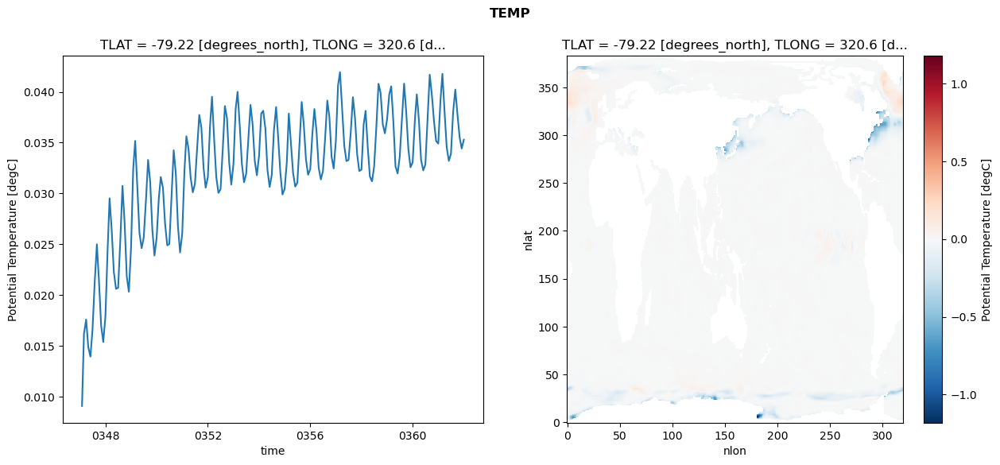

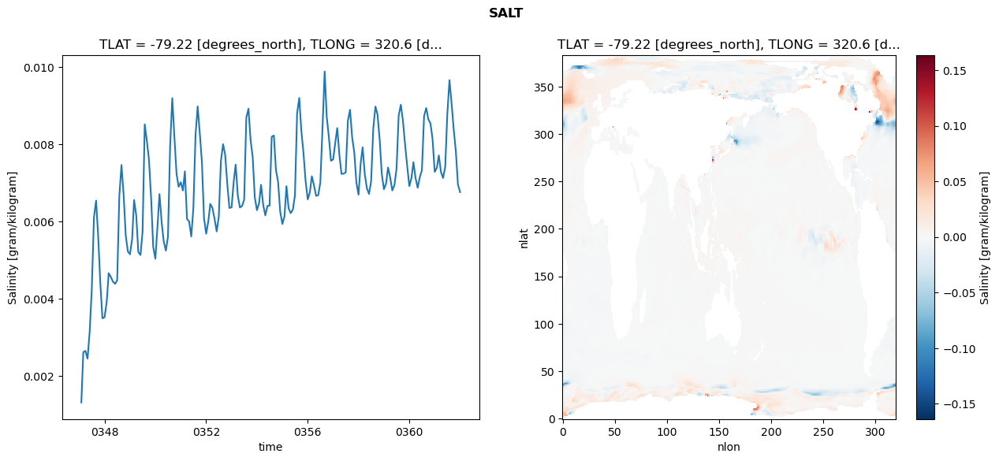

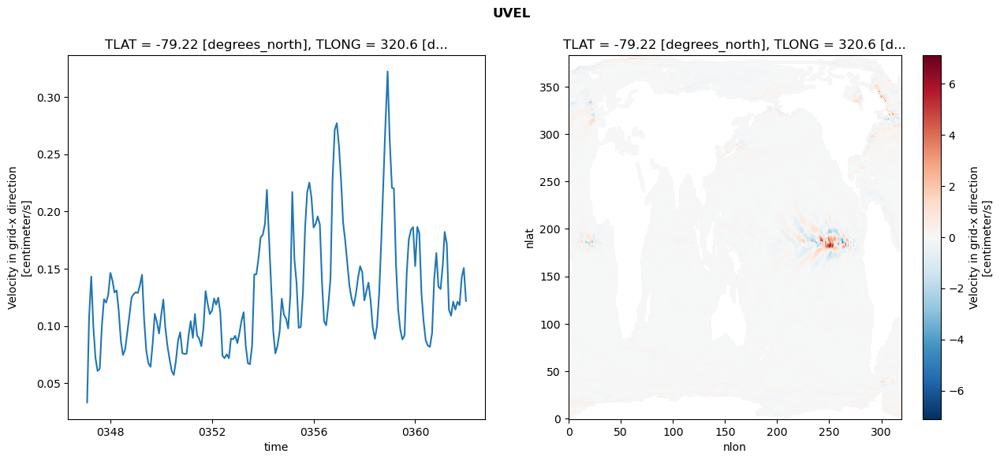

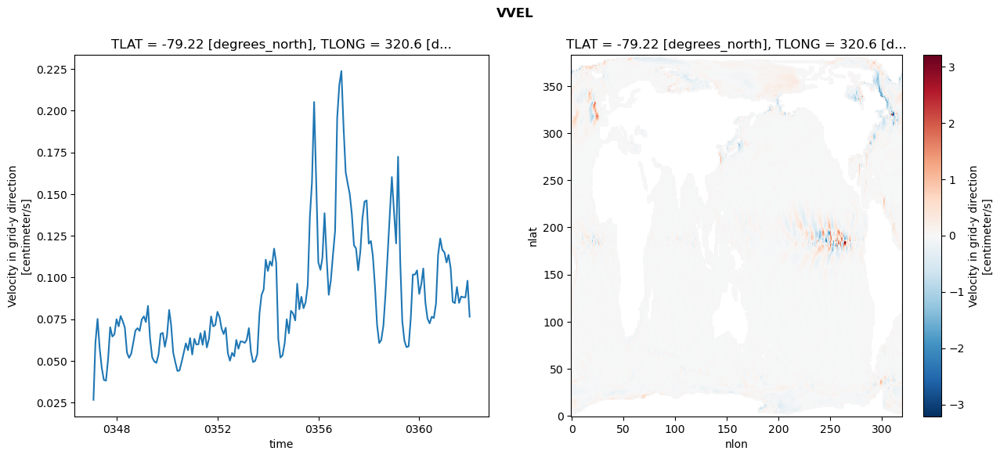

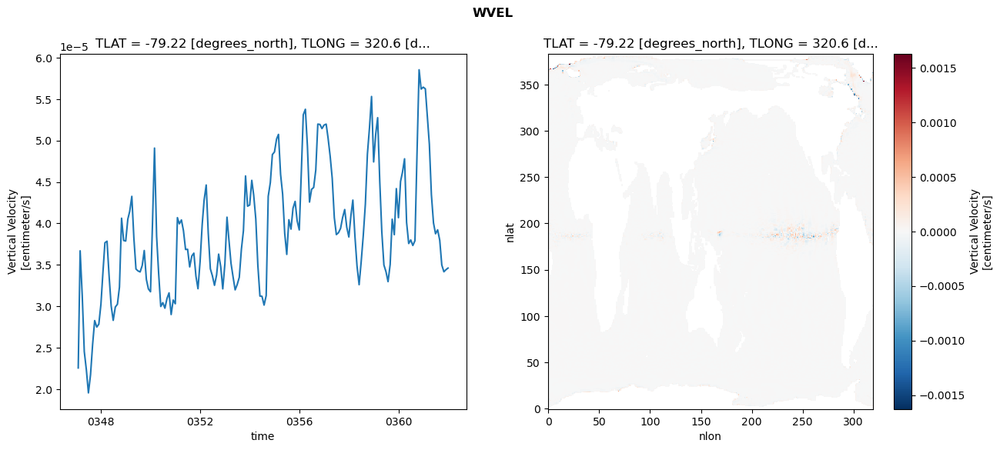

...

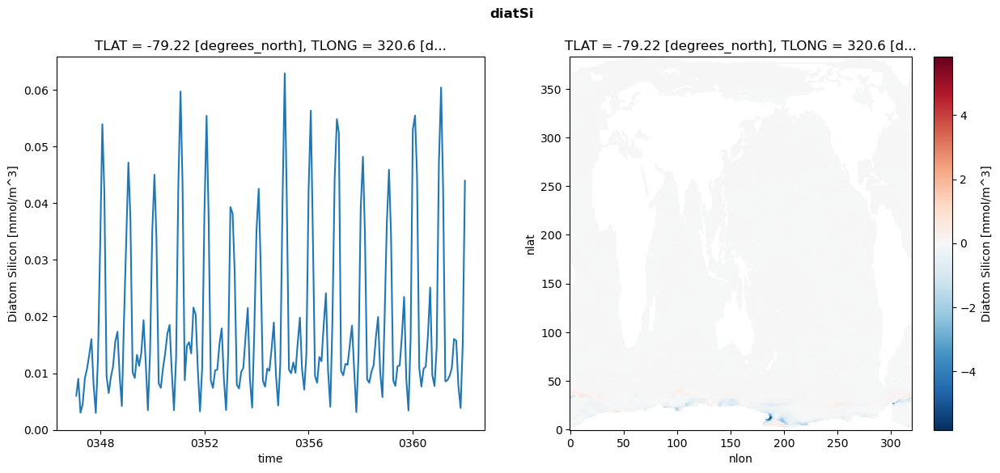

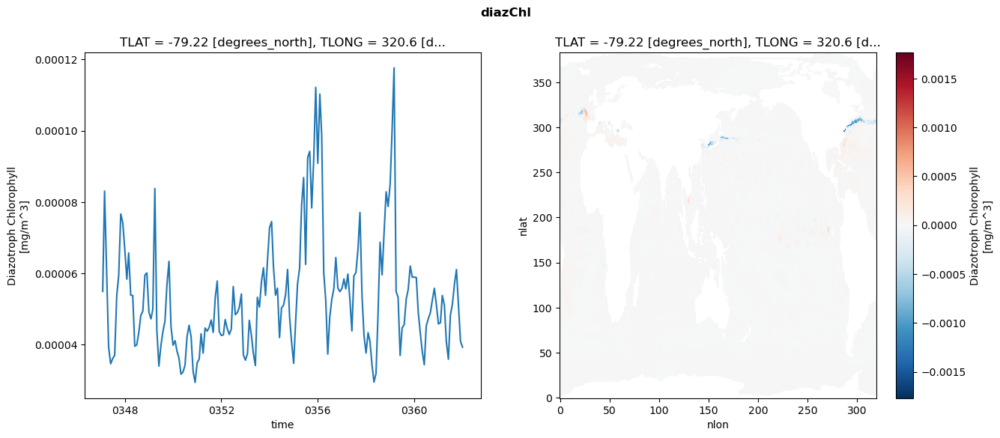

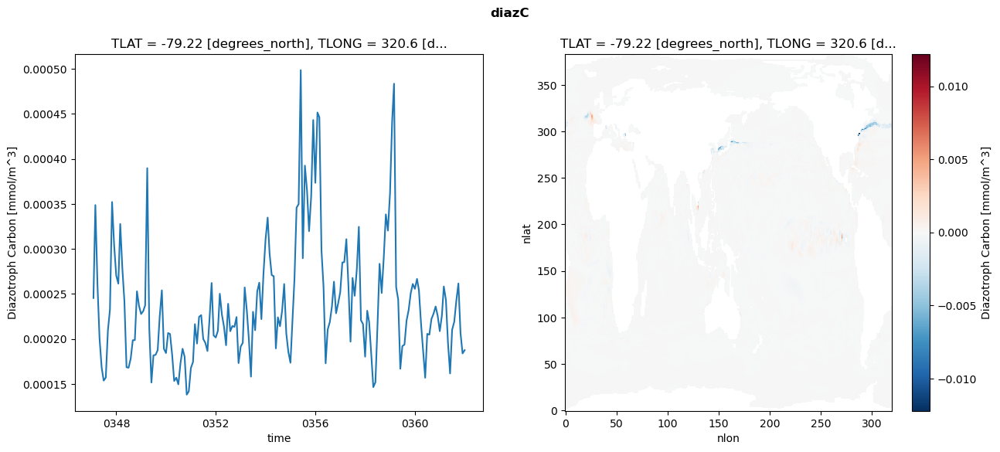

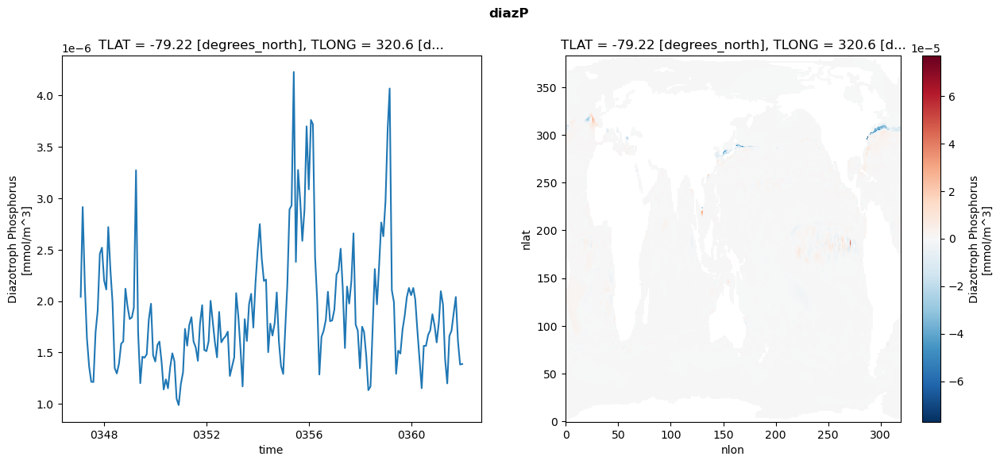

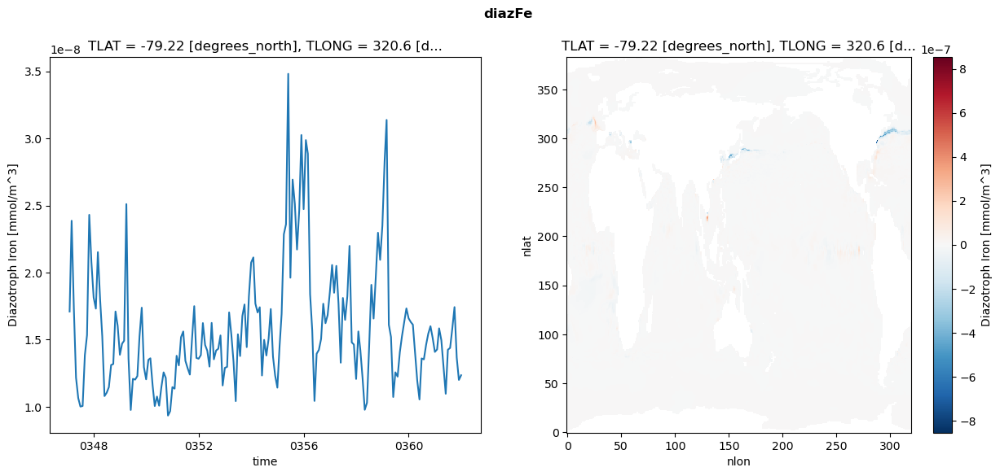

In [27]:
plt.rcParams.update({'figure.max_open_warning': 0})

for v in variables:
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))
    ds_o[f"{v}_rmse"].plot(ax=axs[0])   
    ds_o[f"{v}_diff"].plot(ax=axs[1])
    plt.suptitle(v, fontweight="bold")
